In [2]:
import library
from matplotlib import pyplot as plt
import color_features
import glcm_features
import hair_removal
import pandas as pd
import numpy as np
import cv2
import os

100
th  (1024, 1024)
th  (450, 600)
th  (450, 600)
th  (1024, 1024)
th  (450, 600)
th  (450, 600)
th  (1024, 1024)
th  (1024, 1024)
th  (450, 600)
th  (1024, 1024)
th  (450, 600)
th  (450, 600)
th  (450, 600)
th  (1024, 1024)
th  (450, 600)
th  (1024, 1024)
th  (1024, 1024)
th  (1024, 1024)
th  (450, 600)
th  (450, 600)


/tmp/ipykernel_9842/863040528.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1,2)


th  (450, 600)
th  (685, 1024)
th  (1024, 1024)
th  (1024, 1024)
th  (1024, 1024)
th  (1024, 1024)
th  (450, 600)
th  (450, 600)
th  (1024, 1024)
th  (1024, 1024)
th  (1024, 1024)
th  (1024, 1024)
th  (1024, 1024)
th  (680, 1024)
th  (1024, 1024)
th  (450, 600)
th  (1024, 1024)
th  (450, 600)
th  (1024, 1024)
th  (1024, 1024)
th  (450, 600)
th  (1024, 1024)
th  (450, 600)
th  (768, 1024)
th  (1024, 1024)
th  (680, 1024)
th  (1024, 1024)
th  (1024, 1024)
th  (450, 600)
th  (1024, 1024)
th  (450, 600)
th  (1024, 1024)
th  (680, 1024)
th  (450, 600)
th  (1024, 1024)
th  (450, 600)
th  (1024, 1024)
th  (1024, 1024)
th  (1024, 1024)
th  (450, 600)
th  (680, 1024)
th  (450, 600)
th  (450, 600)
th  (1024, 1024)
th  (1024, 1024)
th  (1024, 1024)
th  (1024, 1024)
th  (1024, 1024)
th  (1024, 1024)
th  (450, 600)
th  (1024, 1024)
th  (764, 1024)
th  (450, 600)
th  (450, 600)
th  (1024, 1024)
th  (1024, 1024)
th  (1024, 1024)
th  (1024, 1024)
th  (1024, 1024)
th  (450, 600)
th  (450, 600)
th  (682

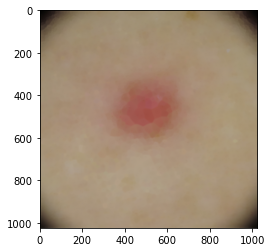

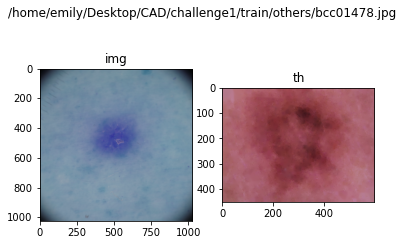

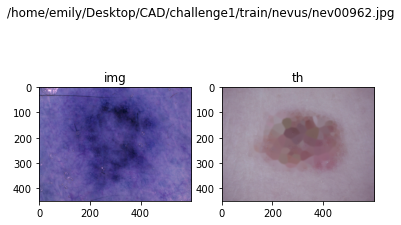

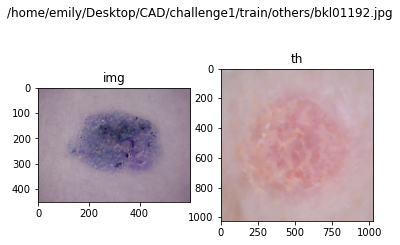

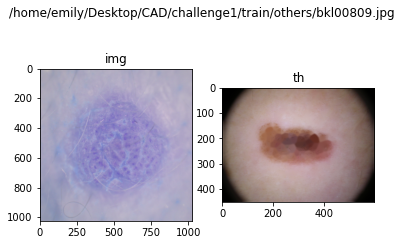

...

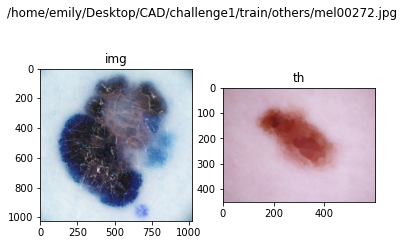

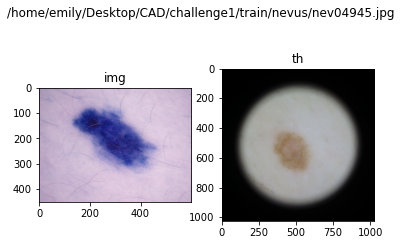

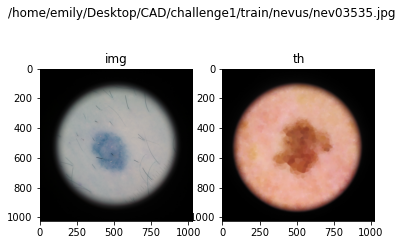

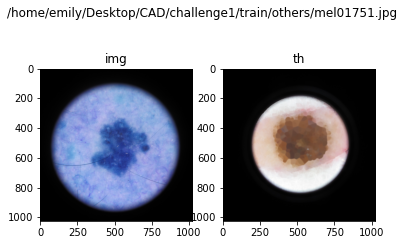

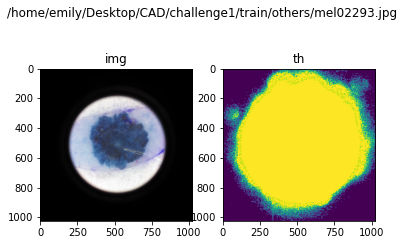

In [3]:
# testing idea of taking of the left most tail of histogram on intensities to
# get rid of vignette problem. producing mask of the tail choosen to see if works


samples = library.get_sample(path = "/home/emily/Desktop/CAD/challenge1/train", amount=100)

for idx, sample in enumerate(samples):
    img = cv2.imread(sample)
    
    output_bh = hair_removal.hair_remove(img, 17, 8)

    hairless = cv2.cvtColor(output_bh, cv2.COLOR_BGR2RGB)
    
    min_p = np.percentile(hairless, 12)
    hairless = cv2.cvtColor(hairless, cv2.COLOR_RGB2GRAY)
    
    th = hairless > min_p
    print("th ", th.shape)
    fig, axs = plt.subplots(1,2)
    fig.patch.set_facecolor("white")
    axs[0].imshow(img)
    axs[1].imshow(th)
    axs[0].set_title("img")
    axs[1].set_title("th")
    fig.suptitle(sample)
    
    plt.savefig("/home/emily/Desktop/CAD/test/"+str(idx)+".png")
    

In [5]:
#https://medium.com/@er_95882/colour-vision-lands-experiments-with-colour-constancy-white-balance-and-examples-in-python-93a71d0c4cbe
def grey_world(image):
    image = image / 255.

    pWhite = 0.05
    
    # In OpenCV the channels order is Blue-Green-Red
    red = image[:, :, 2]
    green = image[:, :, 1]
    blue = image[:, :, 0]

    red = red / np.mean(red)
    green = green / np.mean(green)
    blue = blue / np.mean(blue)

    red_sorted = sorted(red.ravel())
    green_sorted = sorted(green.ravel())
    blue_sorted = sorted(blue.ravel())

    total = len(red_sorted)

    max_index = int(total * (1. - pWhite))
    image[:, :, 2] = red / red_sorted[max_index]
    image[:, :, 1] = green / green_sorted[max_index]
    image[:, :, 0] = blue / blue_sorted[max_index]

    return image

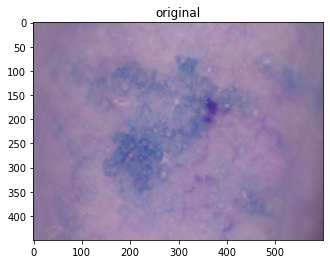

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


clean shape  (450, 600, 3)


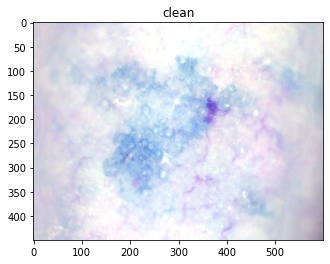

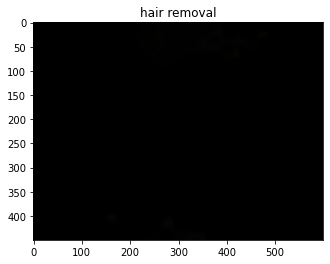

shape  (450, 600, 3)
0.0
(450, 600)


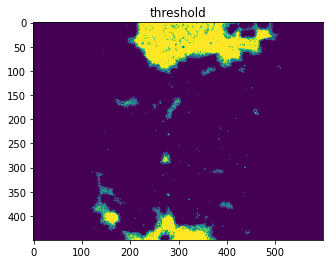

NameError: name 'hairless_rgb' is not defined

In [15]:
sample = os.path.join("/home/emily/Desktop/CAD/challenge1/train/",
                      "others",
                      "{}.jpg".format("bkl00853"))
# "ack00021" textbook vignette
# bcc00221 no vignette
# bkl00160 no vignette
img = cv2.imread(sample)

plt.imshow(img)
plt.title("original")
plt.show()

clean = grey_world(img)
print("clean shape ", clean.shape)

plt.imshow(clean)
plt.title("clean")
plt.show()

output_bh = hair_removal.hair_remove(np.uint8(clean), 17, 8)

plt.imshow(output_bh)
plt.title("hair removal")
plt.show()

print("shape ", output_bh.shape)

hairless = cv2.cvtColor(output_bh, cv2.COLOR_BGR2RGB)
min_p = np.percentile(hairless, 12)
print(min_p)
#hairless = hairless[ hairless > min_p ]

hairless = cv2.cvtColor(hairless, cv2.COLOR_RGB2GRAY)
print(hairless.shape)
th = hairless > min_p
plt.imshow(th)
plt.title("threshold")
plt.show()


plt.hist(hairless_rgb[:,:,0].reshape(-1), 100)
plt.title("r")
plt.show()

plt.imshow(hairless[:,:,0])
plt.title("r")
plt.show()

plt.hist(hairless[:,:,1].reshape(-1), 100)
plt.title("g")
plt.show()

plt.imshow(hairless[:,:,1])
plt.title("g")
plt.show()


plt.hist(hairless[:,:,2].reshape(-1), 100)
plt.title("b")
plt.show()

plt.imshow(hairless[:,:,2])
plt.title("b")
plt.show()

####################################

hairless = cv2.cvtColor(output_bh, cv2.COLOR_BGR2HSV)

plt.hist(hairless[:,:,0].reshape(-1), 100)
plt.title("h")
plt.show()

plt.imshow(hairless[:,:,0])
plt.title("h")
plt.show()

plt.hist(hairless[:,:,1].reshape(-1), 100)
plt.title("s")
plt.show()

plt.imshow(hairless[:,:,1])
plt.title("s")
plt.show()


plt.hist(hairless[:,:,2].reshape(-1), 100)
plt.title("v")
plt.show()

plt.imshow(hairless[:,:,2])
plt.title("v")
plt.show()

####################################

hairless = cv2.cvtColor(np.uint8(output_bh), cv2.COLOR_RGB2LAB)

plt.hist(hairless[:,:,0].reshape(-1), 100)
plt.title("l")
plt.show()

plt.imshow(hairless[:,:,0])
plt.title("l")
plt.show()

plt.hist(hairless[:,:,1].reshape(-1), 100)
plt.title("a")
plt.show()

plt.imshow(hairless[:,:,1])
plt.title("a")
plt.show()


plt.hist(hairless[:,:,2].reshape(-1), 100)
plt.title("b")
plt.show()

plt.imshow(hairless[:,:,2])
plt.title("b")
plt.show()

####################################

hairless = cv2.cvtColor(output_bh, cv2.COLOR_BGR2YCR_CB)

plt.hist(hairless[:,:,0].reshape(-1), 100)
plt.title("y")
plt.show()

plt.imshow(hairless[:,:,0])
plt.title("y")
plt.show()

plt.hist(hairless[:,:,1].reshape(-1), 100)
plt.title("c1")
plt.show()

plt.imshow(hairless[:,:,1])
plt.title("c1")
plt.show()


plt.hist(hairless[:,:,2].reshape(-1), 100)
plt.title("c2")
plt.show()

plt.imshow(hairless[:,:,2])
plt.title("c2")
plt.show()

colors = color_features.extract_color_features(output_bh)

    